# Setup

In [1]:
#research23_1
#conda install -c conda-forge scanpy
#conda install -c conda-forge jupyterlab
#conda remove --force numpy, scipy
#pip install numpy
#pip install scipy
#pip install seaborn numpy scipy
###### Matplotlib at 3.7 is incompatible with scanpy
###### https://discourse.scverse.org/t/metaclass-conflict-from-trying-to-import-scanpy/1133
# installed a lower version of matplotlib and error fixed.

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import sys
from statsmodels import robust
import matplotlib.pyplot as plt
import os.path
import anndata as ad
import seaborn as sns
import matplotlib as mpl
import os
import harmonypy
# import scvi

#sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150)
pd.set_option('display.max_columns', None)


In [3]:
os.chdir("C:\\Users\\sambe\\OneDrive - Newcastle University\\Research projects\\python")
bigdata = 'C:\\Users\\sambe\\Documents\\bigdata\\'
figures = "C:\\Users\\sambe\\OneDrive - Newcastle University\\Research projects\\python\\figures"
datas = "C:\\Users\\sambe\\OneDrive - Newcastle University\\Research projects\\python\\data"
writes = "C:\\Users\\sambe\\OneDrive - Newcastle University\\Research projects\\python\\write"
os.getcwd()

'C:\\Users\\sambe\\OneDrive - Newcastle University\\Research projects\\python'

In [4]:
pan_immune_bcells = sc.read(bigdata + 'pan_immune_bcells.h5ad')
display(pan_immune_bcells)
#pan_immune_pcells = sc.read(bigdata + "pan_immune_pcells.h5ad")
#display(pan_immune_pcells)
#pan_stroma_cells  = sc.read(bigdata + "pan_stroma_cells.h5ad")
#display(pan_stroma_cells)


AnnData object with n_obs × n_vars = 63942 × 33538
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'old_annotation_uniform', 'organ', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Sample', 'scvi_clusters', 'is_maternal_contaminant', 'anno_lvl_2_final_clean', 'celltype_annotation'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'scvi_model_var'

# preprocessing

##### ambient RNA, doublets, and mitocondrial

In [5]:
sc.pp.calculate_qc_metrics(pan_immune_bcells)

(                                 n_genes_by_counts  log1p_n_genes_by_counts  \
 index                                                                         
 FCAImmP7579224-CTAATGGCACTGTGTA               5492                 8.611230   
 FCAImmP7579224-TCTTTCCCAAGCCGTC               5176                 8.551981   
 FCAImmP7579224-GTATCTTAGCGACGTA               4845                 8.485909   
 FCAImmP7579224-CCCAATCAGCCACGCT               3813                 8.246434   
 FCAImmP7579224-GGAATAATCAGGTAAA               4007                 8.296048   
 ...                                            ...                      ...   
 FCAImmP7277565-TAGTTGGTCTCTGTCG                928                 6.834109   
 FCAImmP7277565-CAGGTGCAGACGCAAC                885                 6.786717   
 FCAImmP7277565-GTGCAGCAGAGCTGGT               1005                 6.913737   
 FCAImmP7277565-TACTCGCCACGTCTCT                994                 6.902743   
 FCAImmP7277565-GAACATCGTACCAGTT        

In [6]:
sc.pp.filter_cells(pan_immune_bcells, min_genes=200)
sc.pp.filter_genes(pan_immune_bcells, min_cells=3)
# doesn't seem to do anything as the cells are already cut.

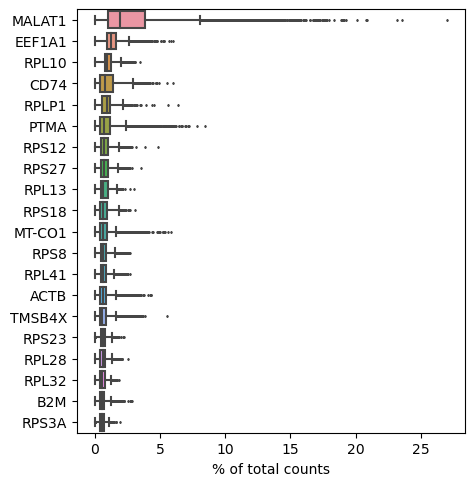

In [7]:
sc.pl.highest_expr_genes(pan_immune_bcells, n_top=20,  save='_pp_b1.pdf')

In [8]:
pan_immune_bcells.var['mt'] = pan_immune_bcells.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(pan_immune_bcells, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


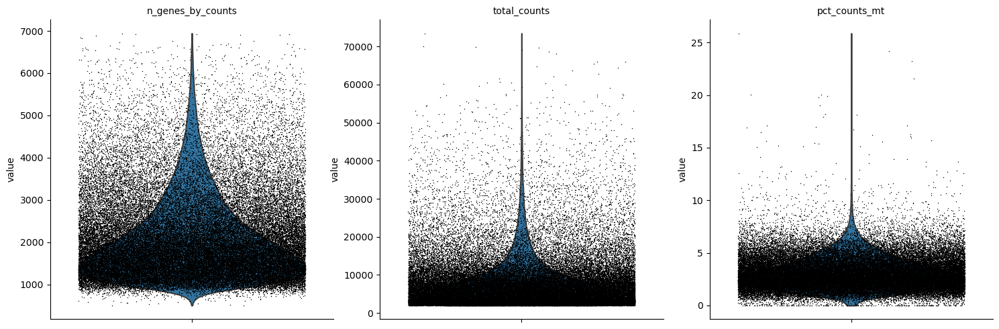

In [9]:
sc.pl.violin(pan_immune_bcells, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True,  save='_pp_b1.pdf')
# displays the cap of mitocondrial dna at 25% of gene count.
# n_genes_by_counts displays the number of genes for each row in the matrix that contain a single value(aren't just zero).

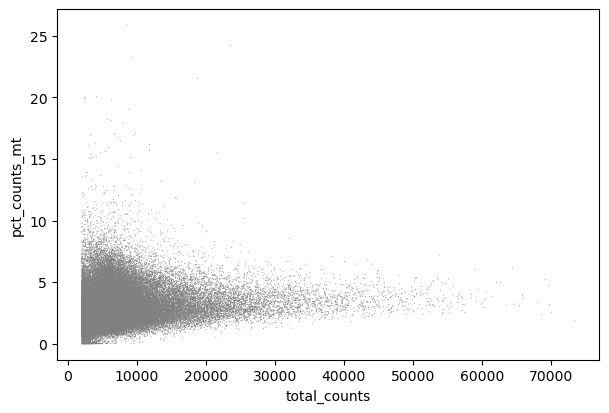

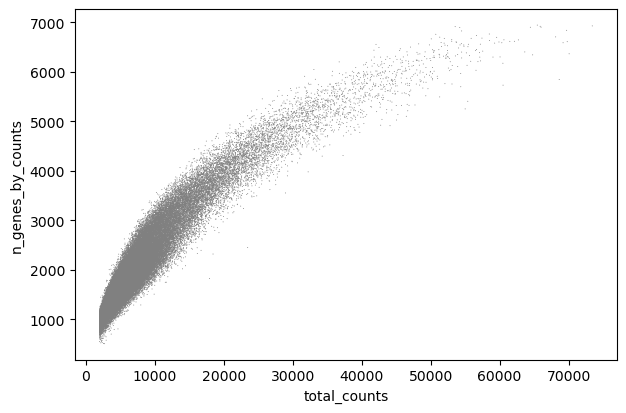

In [10]:
sc.pl.scatter(pan_immune_bcells, x='total_counts', y='pct_counts_mt', save='_pp_b1.pdf')
sc.pl.scatter(pan_immune_bcells, x='total_counts', y='n_genes_by_counts', save='_pp_b1.pdf')
# displays the cap of mitocondrial dna at 25% of gene count.

In [11]:
sc.pp.normalize_total(pan_immune_bcells, target_sum=1e4)


In [12]:
sc.pp.log1p(pan_immune_bcells)


In [13]:
sc.pp.highly_variable_genes(pan_immune_bcells, min_mean=0.0125, max_mean=3, min_disp=0.5)

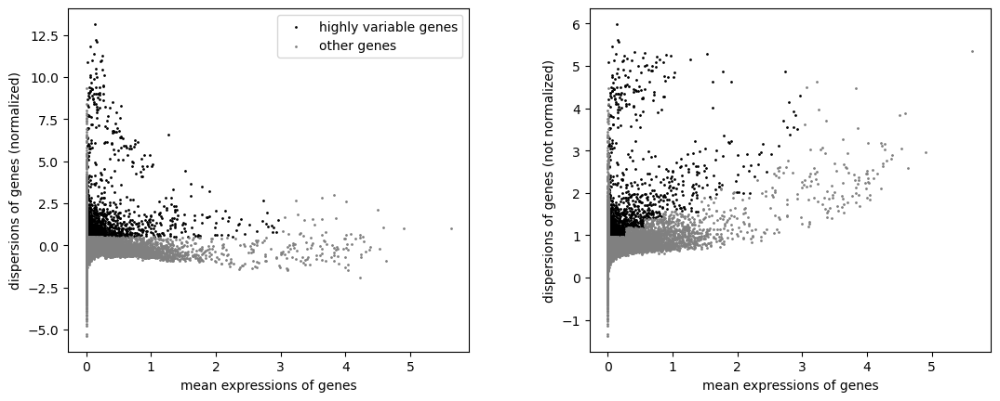

In [14]:
sc.pl.highly_variable_genes(pan_immune_bcells, save='_pp_b1.pdf')
# This displays highly variable genes through calculating mean expression and dispersion measure, which is variance/mean. 
# After this the genes are split into bins based on average expression, then z-normalized the dispersion measure in each bin seperately to identify...
# the genes that were highly variable even within a group of genes with similar expression levels.(https://www.nature.com/articles/nbt.3192)

In [15]:
pan_immune_bcells.raw = pan_immune_bcells.copy()
# creating a raw dataset allows you to refer back to a dataset that has not been 

In [16]:
pan_immune_bcells.obs.sort_values('pct_counts_mt', ascending=False)
# displays that pct_counts_mt displays the % of mitocondrial DNA present of the total counts. 
# the cutoff for the mitocondrial content appears to be at <=25%.

,n_counts,n_genes,file,mito,doublet_scores,predicted_doublets,old_annotation_uniform,organ,Sort_id,age,method,donor,sex,Sample,scvi_clusters,is_maternal_contaminant,anno_lvl_2_final_clean,celltype_annotation,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
index,,,,,,,,,,,,,,,,,,,,,,
FCAImmP7862084-AGTTGGTTCGACAGCC,8496.0,2269,FCAImmP7862084,0.258710,0.129032,False,nan,LI,CD45P,7,5GEX,F61,male,F61_LI_CD45P_FCAImmP7862084,26,False,PRE_PRO_B,PRE_PRO_B,2267,8494.0,2198.0,25.877089
FCAImmP7803030-ACGGCCATCACCCTCA,23561.0,3942,FCAImmP7803030,0.242222,0.149338,False,nan,BM,CD45P,14,5GEX,F51,female,F51_BM_CD45P_FCAImmP7803030,6,False,LARGE_PRE_B,LARGE_PRE_B,3942,23561.0,5707.0,24.222231
FCAImmP7528295-GTTCGGGAGAGAACAG,9171.0,1972,FCAImmP7528295,0.232472,0.237785,False,nan,LI,CD45P,12,5GEX,F38,male,F38_LI_CD45P_FCAImmP7528295,0,False,MATURE_B,MATURE_B,1972,9171.0,2132.0,23.247192
FCAImmP7277559-TTCGGTCAGCTAAACA,18795.0,3445,FCAImmP7277559,0.215536,0.191837,False,nan,BM,CD45N,17,3GEX,F29,female,F29_BM_CD45N_FCAImmP7277559,6,False,LARGE_PRE_B,LARGE_PRE_B,3445,18795.0,4051.0,21.553604
FCAImmP7862084-CGTTAGACAGACGCCT,4167.0,1762,FCAImmP7862084,0.200624,0.079452,False,nan,LI,CD45P,7,5GEX,F61,male,F61_LI_CD45P_FCAImmP7862084,10,False,PRO_B,PRO_B,1762,4167.0,836.0,20.062395
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FCAImmP7292035-GAAATGATCAACACCA,3453.0,1116,FCAImmP7292035,0.000000,0.055644,False,PRE B CELL,BM,TOT,14,5GEX,F30,male,F30_BM_TOT_FCAImmP7292035,6,False,LARGE_PRE_B,LARGE_PRE_B,1116,3453.0,0.0,0.000000
FCAImmP7292035-CGACCTTAGGGATACC,3539.0,1144,FCAImmP7292035,0.000000,0.027611,False,PRE PRO B CELL,BM,TOT,14,5GEX,F30,male,F30_BM_TOT_FCAImmP7292035,10,False,PRO_B,PRO_B,1144,3539.0,0.0,0.000000
FCAImmP7292035-CACACAATCCCAGGTG,2907.0,1089,FCAImmP7292035,0.000000,0.031289,False,PRE B CELL,BM,TOT,14,5GEX,F30,male,F30_BM_TOT_FCAImmP7292035,6,False,LARGE_PRE_B,LARGE_PRE_B,1089,2907.0,0.0,0.000000


In [17]:
pan_immune_bcells = pan_immune_bcells[:, pan_immune_bcells.var.highly_variable].copy()
#removes all but the highly variable genes selected in the "sc.pl.highly_variable_genes(pan_immune_bcells)" code;

In [18]:
pan_immune_bcells.var
# 1469 genes remain after filtering for the highly variable.

,GeneID,GeneName,highly_variable,means,dispersions,dispersions_norm,scvi_model_var,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
CD99,ENSG00000002586,CD99,True,1.491373,2.647933,1.361542,True,35336,False,35336,2.281693,44.737418,145896.0
HS3ST1,ENSG00000002587,HS3ST1,True,0.432570,1.369478,0.851850,True,13436,False,13436,0.307560,78.987207,19666.0
WNT16,ENSG00000002745,WNT16,True,0.021900,1.034944,0.686978,True,807,False,807,0.017750,98.737919,1135.0
MAD1L1,ENSG00000002822,MAD1L1,True,0.545537,1.423104,0.956140,True,19463,False,19463,0.488740,69.561478,31251.0
DBNDD1,ENSG00000003249,DBNDD1,True,0.034194,1.121211,0.904296,True,1084,False,1084,0.023427,98.304714,1498.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC092053.3,ENSG00000284669,AC092053.3,True,0.029639,1.119941,0.901099,True,949,False,949,0.015733,98.515842,1006.0
AC073111.5,ENSG00000284691,AC073111.5,True,0.275955,0.975210,0.536500,False,10821,False,10821,0.205671,83.076851,13151.0
AC078864.2,ENSG00000284791,AC078864.2,True,0.020497,1.089510,0.824437,True,671,False,671,0.011761,98.950611,752.0
AL513493.1,ENSG00000285079,AL513493.1,True,0.037061,1.352975,1.488143,True,943,False,943,0.017516,98.525226,1120.0


In [19]:
sc.pp.regress_out(pan_immune_bcells, ['total_counts', 'pct_counts_mt'])
# Simone says its to remove batch effects and technical effects without directly slicing out the data.

In [20]:
pan_immune_bcells.obs

,n_counts,n_genes,file,mito,doublet_scores,predicted_doublets,old_annotation_uniform,organ,Sort_id,age,method,donor,sex,Sample,scvi_clusters,is_maternal_contaminant,anno_lvl_2_final_clean,celltype_annotation,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
index,,,,,,,,,,,,,,,,,,,,,,
FCAImmP7579224-CTAATGGCACTGTGTA,51305.0,5492,FCAImmP7579224,0.046467,0.176471,False,nan,SK,CD45P,12,5GEX,F45,female,F45_SK_CD45P_FCAImmP7579224,6,False,LARGE_PRE_B,LARGE_PRE_B,5492,51305.0,2384.0,4.646721
FCAImmP7579224-TCTTTCCCAAGCCGTC,28616.0,5176,FCAImmP7579224,0.035994,0.152941,False,B CELL,SK,CD45P,12,5GEX,F45,female,F45_SK_CD45P_FCAImmP7579224,10,False,PRE_PRO_B,PRE_PRO_B,5175,28615.0,1030.0,3.599511
FCAImmP7579224-GTATCTTAGCGACGTA,28053.0,4845,FCAImmP7579224,0.033651,0.125320,False,B CELL,SK,CD45P,12,5GEX,F45,female,F45_SK_CD45P_FCAImmP7579224,10,False,PRO_B,PRO_B,4845,28053.0,944.0,3.365059
FCAImmP7579224-CCCAATCAGCCACGCT,24567.0,3813,FCAImmP7579224,0.038100,0.133690,False,B CELL,SK,CD45P,12,5GEX,F45,female,F45_SK_CD45P_FCAImmP7579224,10,False,PRO_B,PRO_B,3813,24567.0,936.0,3.809989
FCAImmP7579224-GGAATAATCAGGTAAA,20510.0,4007,FCAImmP7579224,0.044174,0.133690,False,B CELL,SK,CD45P,12,5GEX,F45,female,F45_SK_CD45P_FCAImmP7579224,26,False,PRE_PRO_B,PRE_PRO_B,4007,20510.0,906.0,4.417357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FCAImmP7277565-TAGTTGGTCTCTGTCG,2378.0,928,FCAImmP7277565,0.045416,0.081340,False,B CELL,TH,CD45N,14,3GEX,F30,male,F30_TH_CD45N_FCAImmP7277565,11,False,SMALL_PRE_B,SMALL_PRE_B,928,2378.0,108.0,4.541632
FCAImmP7277565-CAGGTGCAGACGCAAC,2252.0,885,FCAImmP7277565,0.015098,0.098390,False,PRE PRO B CELL,TH,CD45N,14,3GEX,F30,male,F30_TH_CD45N_FCAImmP7277565,11,False,SMALL_PRE_B,SMALL_PRE_B,885,2252.0,34.0,1.509769
FCAImmP7277565-GTGCAGCAGAGCTGGT,2115.0,1005,FCAImmP7277565,0.017021,0.089376,False,PRE PRO B CELL,TH,CD45N,14,3GEX,F30,male,F30_TH_CD45N_FCAImmP7277565,15,False,LATE_PRO_B,LATE_PRO_B,1005,2115.0,36.0,1.702128


In [21]:
sc.pp.scale(pan_immune_bcells, max_value=10)
# This function sets the mean of all the data to 0 and cuts data with a standard deviation of greater than 10. This allows data to be compared to itself.
# A look at the .obs and .var files suggests no genes or cells get cut in our data.

In [22]:
sc.tl.pca(pan_immune_bcells, svd_solver='arpack')
#dimensionality reduction to view the data.
# an SVD solver is described by this link: 
# https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8#:~:text=SVD%20is%20another%20decomposition%20method,of%20SVD%2C%20modified%20from%20source.

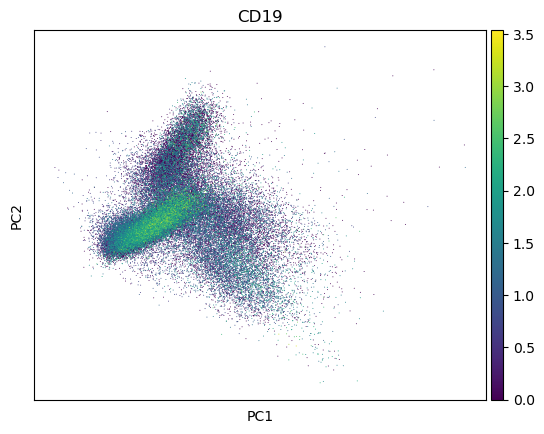

In [23]:
sc.pl.pca(pan_immune_bcells, color='CD19')
# the actual plot, plotted to CST3 gene

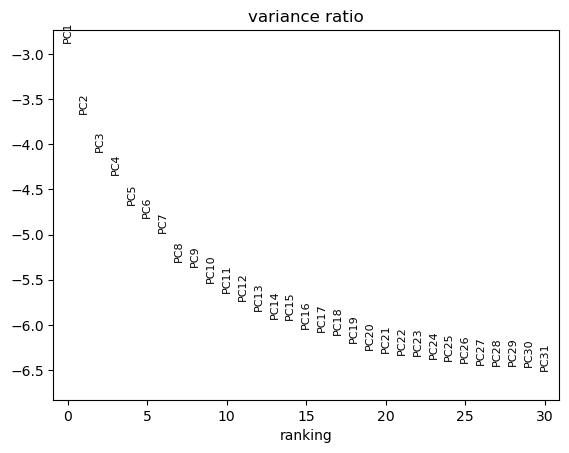

In [24]:
sc.pl.pca_variance_ratio(pan_immune_bcells, log=True)


### Batch correction

In [25]:
pan_immune_bcells_harm = pan_immune_bcells
# producing a second anndata object for harmony batch correction without altering original.

In [26]:
sc.external.pp.harmony_integrate(pan_immune_bcells_harm, 'method')


2023-04-06 10:31:38,190 - harmonypy - INFO - Iteration 1 of 10
2023-04-06 10:32:16,377 - harmonypy - INFO - Iteration 2 of 10
2023-04-06 10:32:52,500 - harmonypy - INFO - Iteration 3 of 10
2023-04-06 10:33:31,798 - harmonypy - INFO - Converged after 3 iterations


In [27]:
pan_immune_bcells

AnnData object with n_obs × n_vars = 63942 × 1469
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'old_annotation_uniform', 'organ', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Sample', 'scvi_clusters', 'is_maternal_contaminant', 'anno_lvl_2_final_clean', 'celltype_annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'scvi_model_var', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca', 'X_pca_harmony'
    varm: 'PCs'

### Nearest Neighbours

In [28]:
sc.pp.neighbors(pan_immune_bcells, n_neighbors=10, n_pcs=40, use_rep='X_pca')

In [29]:
sc.pp.neighbors(pan_immune_bcells_harm, use_rep='X_pca_harmony')
#, n_neighbors=10, n_pcs=40,

In [30]:
sc.tl.umap(pan_immune_bcells)

In [31]:
sc.tl.umap(pan_immune_bcells_harm)

In [32]:
print(pan_immune_bcells)

AnnData object with n_obs × n_vars = 63942 × 1469
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'old_annotation_uniform', 'organ', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Sample', 'scvi_clusters', 'is_maternal_contaminant', 'anno_lvl_2_final_clean', 'celltype_annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'scvi_model_var', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


In [33]:
pan_immune_bcells.uns['pca']

{'params': {'zero_center': True, 'use_highly_variable': True},
 'variance': array([73.551735 , 33.55927  , 22.21262  , 17.179125 , 12.319556 ,
        10.659397 ,  8.995244 ,  6.5371976,  6.1985035,  5.174533 ,
         4.646737 ,  4.233507 ,  3.814785 ,  3.4666026,  3.4308228,
         3.1299205,  3.0129802,  2.9271677,  2.6811929,  2.461324 ,
         2.393599 ,  2.3327131,  2.3114421,  2.2317026,  2.1900723,
         2.1360638,  2.090906 ,  2.0702608,  2.0594046,  2.0369503,
         1.9659033,  1.9551437,  1.9149387,  1.8987466,  1.857856 ,
         1.8274736,  1.8126669,  1.7672971,  1.7624621,  1.7490932,
         1.7335786,  1.6979836,  1.6925204,  1.6543953,  1.6362004,
         1.6204916,  1.6020494,  1.5913272,  1.5639573,  1.5490465],
       dtype=float32),
 'variance_ratio': array([0.05605796, 0.02557743, 0.0169295 , 0.01309319, 0.00938943,
        0.00812413, 0.00685579, 0.00498237, 0.00472423, 0.00394381,
        0.00354154, 0.0032266 , 0.00290746, 0.00264209, 0.00261483,

In [34]:
#sc.pl.umap(pan_immune_bcells, color=['method'], use_raw=False, save='_be-method_b1.pdf')



#CD19, CD 20, CD34, CD38, and CD45R
# just threw in some B cell markers because its more applicable.(use the literature reccomended and the "rank_genes_groups" function)

#***************** plot by donor, tissue and batch, see if the batch effects are present. age too

C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


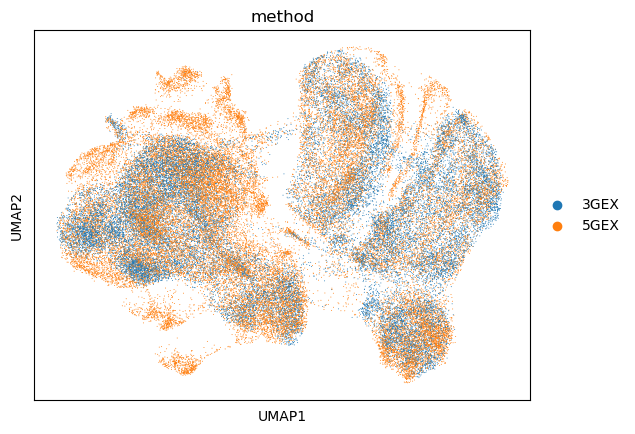

C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


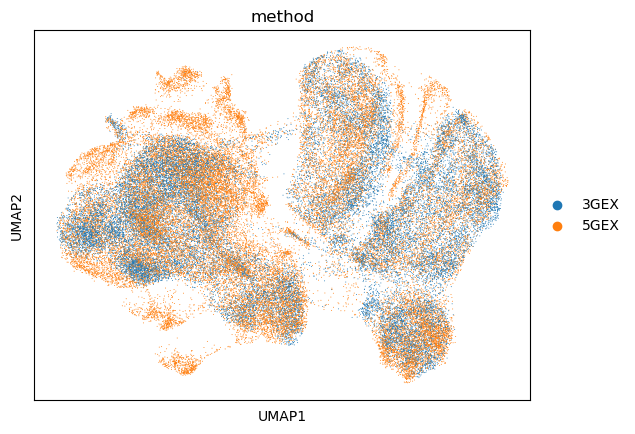

In [35]:
sc.pl.umap(pan_immune_bcells, use_raw=False, color=['method'])
sc.pl.umap(pan_immune_bcells_harm, color=['method'])

C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


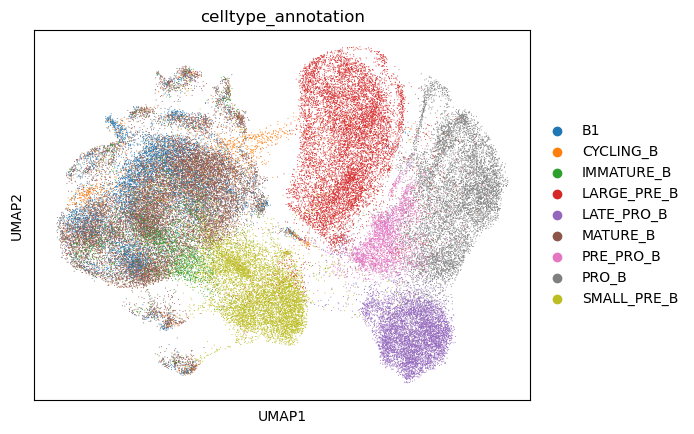

In [36]:
sc.pl.umap(pan_immune_bcells_harm, color=['celltype_annotation'],save = 'trajectory_by_hand.png')

In [37]:
'celltype_annotation'

'celltype_annotation'

In [38]:
batcheffects = ['predicted_doublets','Sort_id','pct_counts_mt','organ','celltype_annotation','sex','method','age']

In [39]:
#for x in batcheffects:
#    sc.pl.umap(pan_immune_bcells, color=[x], use_raw=False, save = '_' + x + '_be_b1.pdf')


# Naming system: type of graph(umap), column from data (predicted_doublets), why the graph exists(to test for batch effects(be)), the file it is from(b1), and the file format (pdf).
# harmony attributes to post-harmony application

In [40]:
#for x in batcheffects:
#    sc.pl.umap(pan_immune_bcells_harm, color=[x], use_raw=False, save = '_' + x + '_harmony_b1.pdf')
# the harmony pdf documents

In [41]:
sc.tl.leiden(pan_immune_bcells)


C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


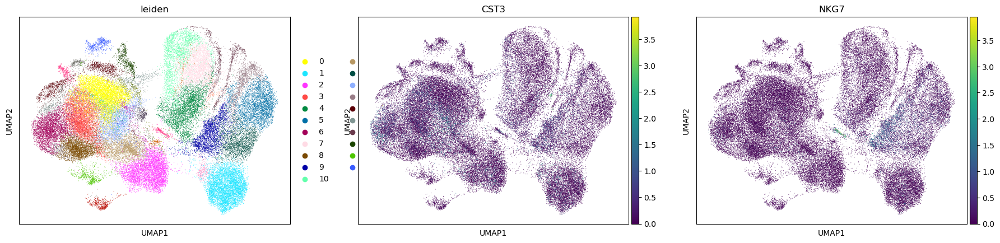

In [42]:
sc.pl.umap(pan_immune_bcells, color=['leiden', 'CST3', 'NKG7'])


In [43]:
#got to decide on how to batch correct.
#sc.external.pp.bbknn

In [44]:

#BBKNN ATTEMPT: the attempt failed but antony gave some ideas: are there any NaN in your neighbours, right package versions, 

#%%time
#sc.external.pp.bbknn(pan_immune_bcells, batch_key='method')


#import bbknn

#bbknn.bbknn(pan_immune_bcells,batch_key='method')

#sc.tl.umap(pan_immune_bcells)

#sc.pl.umap(pan_immune_bcells, color=['method', 'celltype_annotation'])

In [45]:
pan_immune_bcells_harm.write_h5ad(filename='data//pan_immune_bcells_harm.h5ad')

## Marker genes

In [46]:
# the marker genes for my replication of the research [Mapping the developing human immune system across organs]
# These have been gathered from the work of jardine et al [Blood and immune development in human fetal bone marrow and Down syndrome] present in supplementary table 6 of that study.
# and the work of Popescu et al [Decoding human fetal liver haematopoiesis] in supplementary table 3
# the combination of these two made up the marker genes for my main replication paper.
# main article used SCVI so i should probably use that too.
# monocle is a trajectory package in python that is the standard for producing trajectories

# found the github for main paper (https://github.com/Teichlab/Pan_fetal_immune/tree/master/metadata/marker_genes) 
#contains files with the marker genes used.


In [3]:
markers = pd.read_csv('https://raw.githubusercontent.com/Teichlab/Pan_fetal_immune/ef0241a2a91e40dc643f31e2b0e1cebc46684258/metadata/marker_genes/B_marker_genes_09072021_clean.csv',index_col=0,parse_dates=[0])
# error until I read the file in from raw.

NameError: name 'pd' is not defined

In [48]:

display(markers.loc[markers['anno_lvl_2'] == 'HSC_MPP'])

display(markers.loc[markers['gene'] == 'CD34'])


,gene,anno_lvl_2
0,CLEC9A,HSC_MPP
1,CD34,HSC_MPP
4,SPINK2,HSC_MPP
10,KIT,HSC_MPP
13,FLT3,HSC_MPP


,gene,anno_lvl_2
1,CD34,HSC_MPP
2,CD34,CMP
3,CD34,ELP


In [2]:
markername = markers['anno_lvl_2'].unique()
genename = markers['gene'].unique()

NameError: name 'markers' is not defined

In [49]:
for x in markername:
    display(markers.loc[markers['anno_lvl_2'] == x])

NameError: name 'markername' is not defined

In [1]:
for x in genename:
    display(markers.loc[markers['gene'] == x])

NameError: name 'genename' is not defined

In [ ]:
markers

# SIMONE CODE 

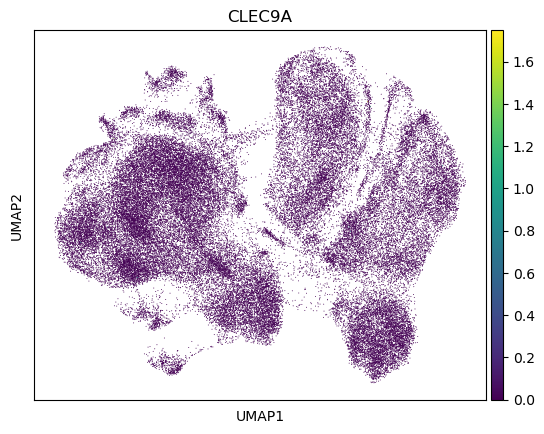

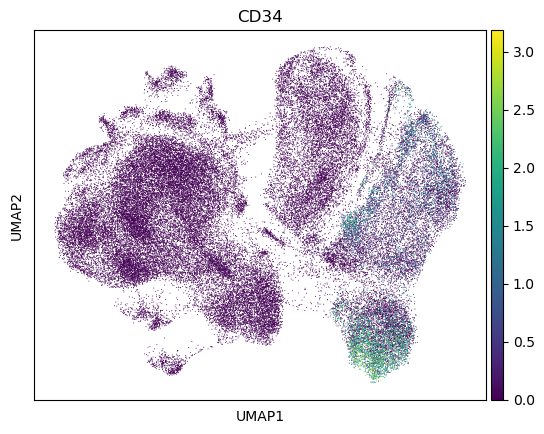

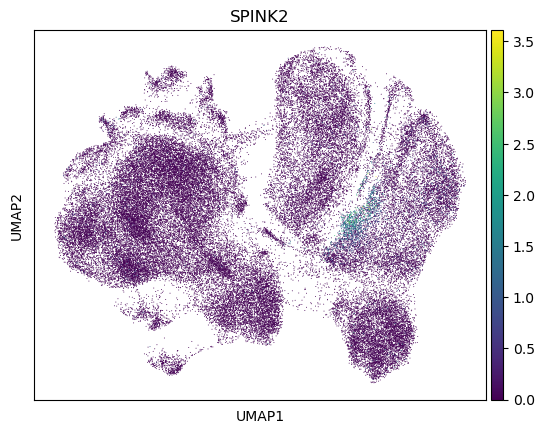

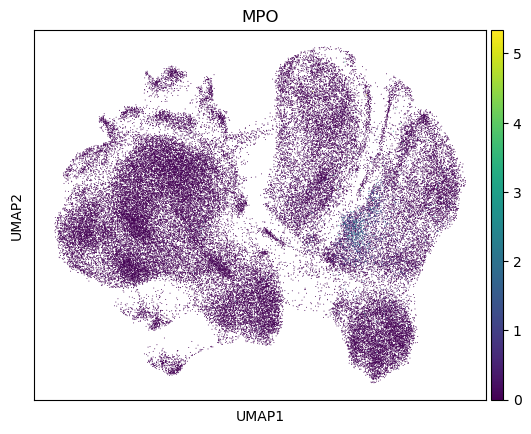

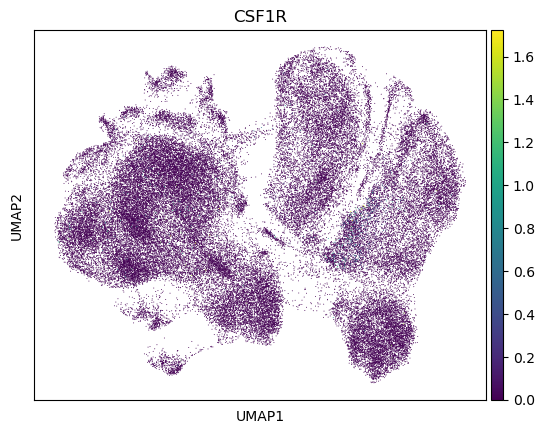

...

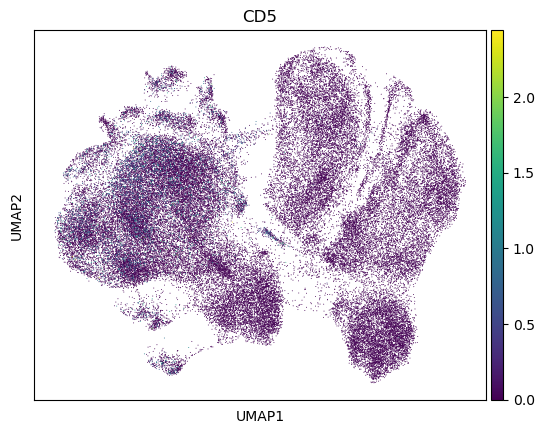

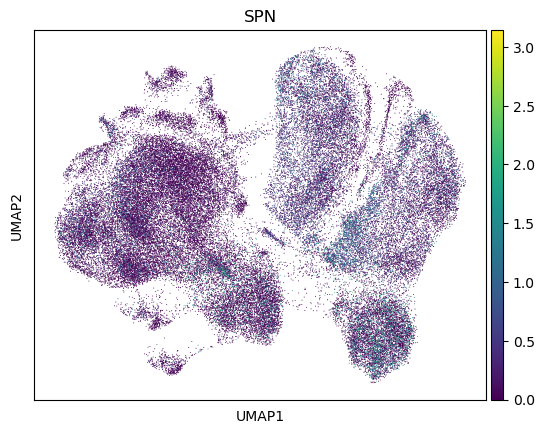

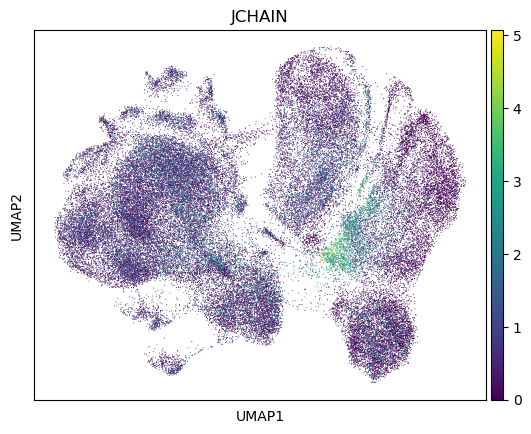

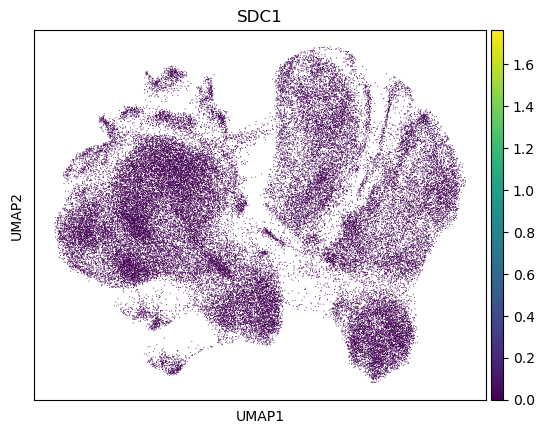

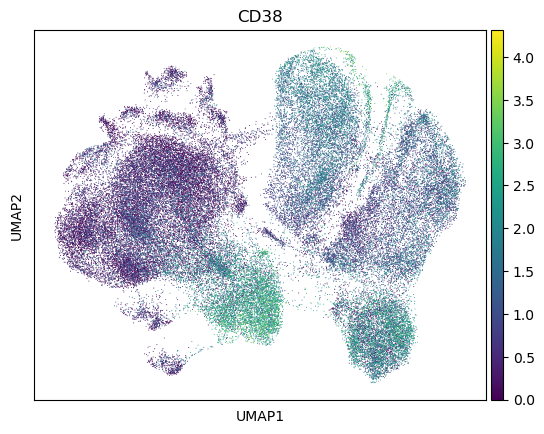

In [142]:
for x in paper_markers_list:
    sc.pl.umap(pan_immune_bcells_harm, color=[x])


In [118]:
pan_immune_bcells_harm

AnnData object with n_obs × n_vars = 63942 × 1469
    obs: 'n_counts', 'n_genes', 'file', 'mito', 'doublet_scores', 'predicted_doublets', 'old_annotation_uniform', 'organ', 'Sort_id', 'age', 'method', 'donor', 'sex', 'Sample', 'scvi_clusters', 'is_maternal_contaminant', 'anno_lvl_2_final_clean', 'celltype_annotation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'GeneID', 'GeneName', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'scvi_model_var', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'method_colors', 'celltype_annotation_colors', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [130]:
paper_markers_list = markers["gene"].unique().tolist()
paper_markers_list

['CLEC9A',
 'CD34',
 'SPINK2',
 'MPO',
 'CSF1R',
 'IL7R',
 'KIT',
 'FLT3',
 'CD19',
 'VPREB1',
 'MME',
 'CDC45',
 'DHFR',
 'MKI67',
 'CD27',
 'RAG1',
 'DNTT',
 'MS4A1',
 'CD24',
 'TNFRSF17',
 'IDH2',
 'SPIB',
 'CD40',
 'FCER2',
 'CD5',
 'SPN',
 'JCHAIN',
 'SDC1',
 'CD38']

C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


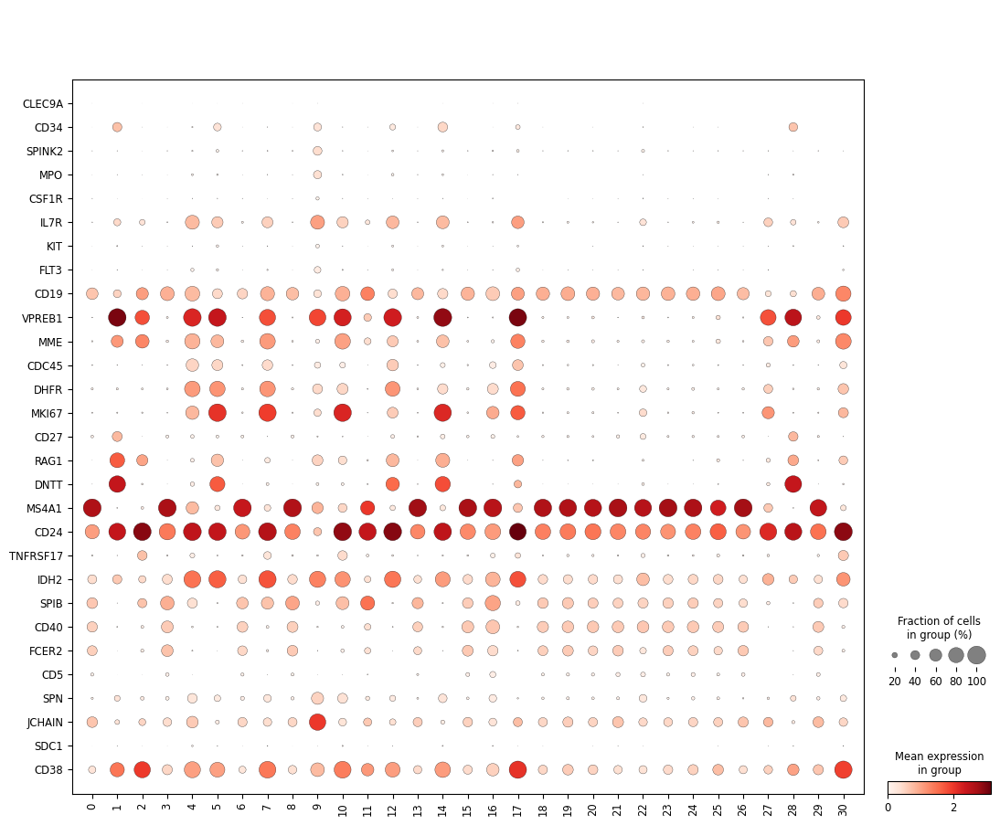

In [131]:
sc.pl.dotplot(pan_immune_bcells_harm, var_names=paper_markers_list, groupby="leiden", swap_axes=True)

In [136]:
sc.tl.draw_graph(pan_immune_bcells_harm, layout='fa')

drawing single-cell graph using layout 'fa'
    finished (0:14:01)


C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


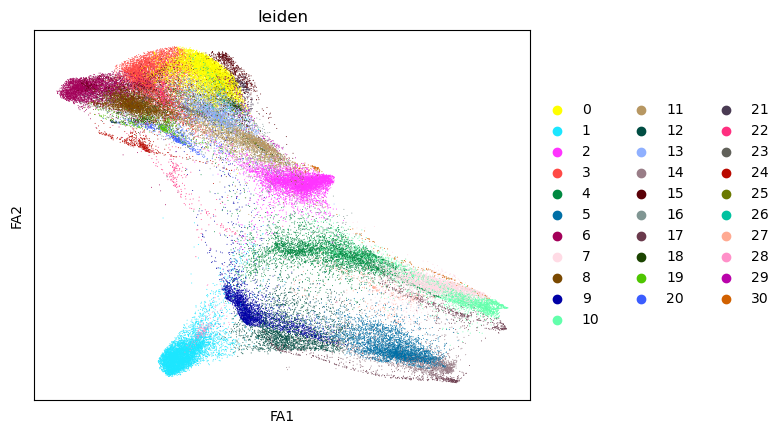

In [137]:
sc.pl.draw_graph(pan_immune_bcells_harm, layout='fa', color="leiden")

# SIMONE CODE NO MORE

In [73]:
markers.to_csv(datas + 'marker_genes_clean.csv')

In [106]:
markername = markers['anno_lvl_2'].unique()
genename = markers['gene'].unique()

#display(markers.loc[markers['gene'] == 'CD34'])

# next goal is to mutate a column in main data that aligns these cell type annotations ot the relevant genes and does
# so without bias (i remember a discussion somewhere about automatically applying labels to the data based on highest % of expressed gene)


In [74]:
bcells = ['PRE_PRO_B', 'PRE_PRO_B_CELL', 'PRE_PRO_B',  'LATE_PRO_B','PRO_B','LARGE_PRE_B','SMALL_PRE_B', 'IMMATURE_B','MATURE_B','B1', 'CYCLING_B']
bcells

['PRE_PRO_B',
 'PRE_PRO_B_CELL',
 'PRE_PRO_B',
 'LATE_PRO_B',
 'PRO_B',
 'LARGE_PRE_B',
 'SMALL_PRE_B',
 'IMMATURE_B',
 'MATURE_B',
 'B1',
 'CYCLING_B']

## End of pre-processing: the use of tutorials target genes means i need to make my own gene list.

ranking genes


C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: Da

    finished (0:00:39)


C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: Da

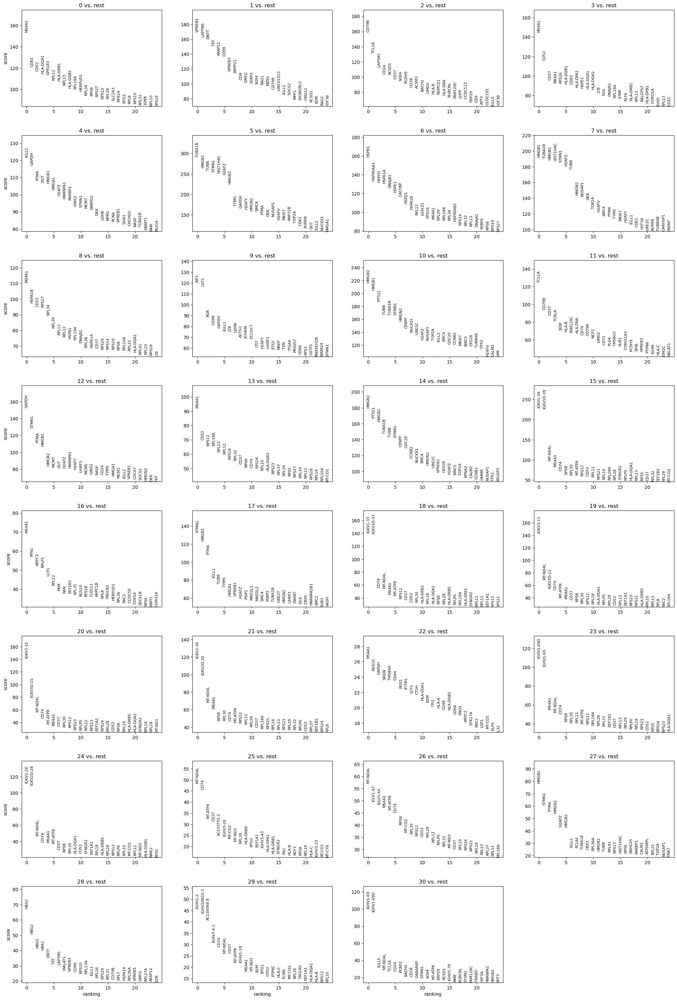

In [87]:
sc.tl.rank_genes_groups(pan_immune_bcells_harm, 'leiden', method='t-test')
sc.pl.rank_genes_groups(pan_immune_bcells_harm, n_genes=25, sharey=False)

In [78]:
sc.settings.verbosity = 2  # reduce the verbosity


In [79]:
pan_immune_bcells_harm = pan_immune_bcells_harm.copy()

ranking genes


C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\sambe\anaconda3\envs\research23\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: Da

    finished (0:11:46)


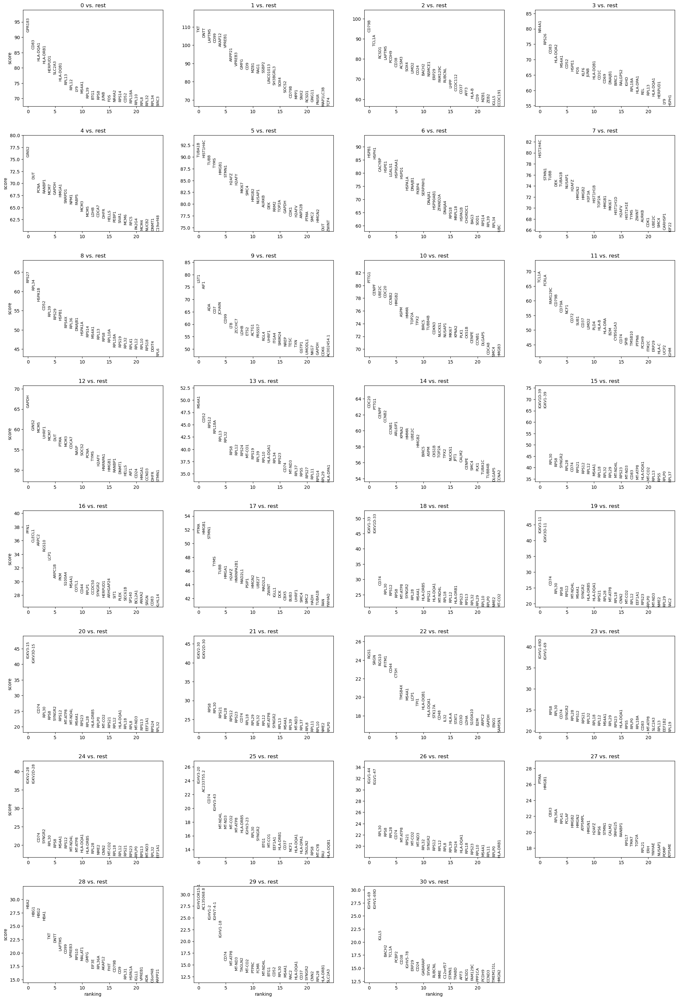

In [80]:
sc.tl.rank_genes_groups(pan_immune_bcells_harm, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(pan_immune_bcells_harm, n_genes=25, sharey=False)

In [83]:
# took 48 minutes before i stopped it. the data doesn't like it for some reason.
sc.tl.rank_genes_groups(pan_immune_bcells_harm, 'leiden', method='logreg')
sc.pl.rank_genes_groups(pan_immune_bcells_harm, n_genes=25, sharey=False)

ranking genes



KeyboardInterrupt



In [ ]:
#sc.pl.rank_genes_groups(pan_immune_bcells_harm, n_genes=25, sharey=False)

In [ ]:
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP']

In [ ]:
sc.tl.rank_genes_groups(pan_immune_bcells, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(pan_immune_bcells, n_genes=25, sharey=False)

In [ ]:
os.getcwd()

In [ ]:
pan_immune_bcells.write(writes + 'pbmc3k.h5ad')

In [ ]:
adata = sc.read((writes + 'pbmc3k.h5ad'))


In [ ]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(30)


In [ ]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)


In [ ]:
adata.uns['log1p']["base"] = None
#https://github.com/scverse/scanpy/issues/2239

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

In [ ]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

In [ ]:
adata = sc.read(writes + 'pbmc3k.h5ad')
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

In [ ]:
sc.pl.violin(adata, ['CST3', 'NKG7', 'PPBP', ], groupby='leiden')


In [ ]:
new_cluster_names = [
    'CD4 T', 'CD14 Monocytes',
    'B', 'CD8 T',
    'NK', 'FCGR3A Monocytes',
    'Dendritic', 'Megakaryocytes']
adata.rename_categories('leiden', new_cluster_names)
# here it all falls down as the data does not match slightly, the road has come to an end.

In [4]:
# the marker genes for my replication of the research [Mapping the developing human immune system across organs]
# These have been gathered from the work of jardine et al [Blood and immune development in human fetal bone marrow and Down syndrome] present in supplementary table 6 of that study.
# and the work of Popescu et al [Decoding human fetal liver haematopoiesis] in supplementary table 3
# the combination of these two made up the marker genes for my main replication paper.
# main article used SCVI so i should probably use that too.
# monocle is a trajectory package in python that is the standard for producing trajectories

# found the github for main paper (https://github.com/Teichlab/Pan_fetal_immune/tree/master/metadata/marker_genes) 
#contains files with the marker genes used.

markers = pd.read_csv('https://github.com/Teichlab/Pan_fetal_immune/blob/master/metadata/marker_genes/B_marker_genes_09072021_clean.csv')

NameError: name 'pd' is not defined

In [3]:
bcells = ['PRE_PRO_B', 'PRE_PRO_B_CELL', 'PRE_PRO_B',  'LATE_PRO_B','PRO_B','LARGE_PRE_B','SMALL_PRE_B', 'IMMATURE_B','MATURE_B','B1', 'CYCLING_B']
bcells

['PRE_PRO_B',
 'PRE_PRO_B_CELL',
 'PRE_PRO_B',
 'LATE_PRO_B',
 'PRO_B',
 'LARGE_PRE_B',
 'SMALL_PRE_B',
 'IMMATURE_B',
 'MATURE_B',
 'B1',
 'CYCLING_B']

In [1]:
stuff = {'rope': 1, 'torch': 6, 'gold coin': 42, 'dagger': 1, 'arrow': 12}


In [4]:
display(stuff)

{'rope': 1, 'torch': 6, 'gold coin': 42, 'dagger': 1, 'arrow': 12}


In [10]:
print(''' alice cat
has a hat
it cat a bat
and caught a rat
praise be to alice cat
''')

 alice cat
has a hat
it cat a bat
and caught a rat
praise be to alice cat



In [7]:
spam.upper(stuff)

NameError: name 'spam' is not defined